# <center> Analysis of Calgary Crime statistics and Disorders Events from 2018 to 2023
### <center> Presented by: Daniela Mañozca Cruz & Ammar Olagunju

## Introduction

<p style='text-align: justify;'> Security is a critical concern for every city around the world and Calgary is not the exemption. As a multicultural city, Calgary attracts people from different countries who come to work and study, each bringing unique perspectives and practices related to personal and family security. The data available to analyze crime statistic of Calgary are not only a reflection of local conditions, but also serve as a guide for newcomers, offering a clearer understanding of which safety precautions are relevant in this new environment. For instance, a foreigner might feel insecure using a cellphone outdoors or believe leaving a house unlocked is safe, while local crime data might suggest otherwise, highlighting cultural differences and fostering awareness. </p>
<p style='text-align: justify;'>This exploratory data analysis on Calgary’s crime statistics, covering data from 2018 to 2023, can provide for the international students of this course a general idea of safety in their new home city. For local students, understanding Calgary´s crime statistics is equally relevant. It provides a clearer picture of the main safety issues in their own city and offers insights into patterns and trends that might otherwise go unnoticed. By identifying key issues and patterns, this analysis contributes to a better-informed community, fostering awareness and proactive safety measures among all residents.</p>

## Guiding questions
<p style='text-align: justify;'>Understanding the crime statistics in Calgary will help identify the most common types of crime, as well as where and when they occur, enabling individuals to improve their self-care practices. The available data makes it possible to determine which communities are most affected by crime, raising awareness among the students in this class. Furthermore, a general perspective on how crime has evolved over time can shed light on the impact of significant events, such as the COVID-19 pandemic, on criminal activity. With these considerations in mind, the goal of this analysis is to address the following guiding questions:</p>

1. What is the most common crime in Calgary, and which community is the most affected?
2. What is the least common crime in Calgary?
3. How has crime evolved over the last five years? Are any crime categories increasing rapidly during this period?
4. Do crime categories follow consistent patterns year after year?
5. Is there any relation between the social disorders and total crimes in Calgary?
6. Do the social disorder events impact the records of crimes within the communities?


## Dataset
<p style='text-align: justify;'>This data analysis is based on two datasets that originally were downloaded in a CSV files, it means the data was structured since, in CSV file, each row represent a full record and the columns are separated by commas.</p>
    
**Crime Statistics data set**: 
<p style='text-align: justify;'>The dataset contained approximately 76,000 entries, with monthly records of crime events. The crimes were categorized as follows: Assault (Non-domestic), Break & Enter - Commercial, Break & Enter - Dwelling, Theft FROM Vehicle, Theft OF Vehicle, Violence\xa0 'Other' (Non-domestic), Street Robbery, Commercial Robbery, Break & Enter - Other Premises;.The information was divided by Calgary communities, covering records from 300 communities, including urban and sub urban/residual communities. The original data spanned from January 2018 to October 2024. However, we excluded 2024 to have only complete years. Adittionally, the time line was not continuous, it had gaps and this was challenge, specially because we discovered it when plotting the data. See a sample of the original dataframe:</p>


In [263]:
crime_file="Community_Crime_Statistics_20250118.csv"
crime_df=pd.read_csv(crime_file)
crime_df.head(3)

,Community,Category,Crime Count,Year,Month
0,01B,Assault (Non-domestic),1,2022,11
1,01B,Break & Enter - Commercial,1,2019,6
2,01B,Break & Enter - Commercial,1,2019,8


**Disorder Events data set**: <br>
<p style='text-align: justify;'>The dataset contained approximately 22,000 entries, with monthly records of disorder events. The disorder events did not present any classification.The information was divided by Calgary communities, covering records from 306 communities, including urban and sub urban/residual communities. The original data spanned from January 2018 to November 2024. However, we excluded 2024 to have only complete years, same as we did with the first data set. Adittionally, the time line was not continuous. See a sample of the original dataframe:.</p>


In [265]:
disorder_File="Community_Disorder_Statistics_20250204.csv"
disorder_df=pd.read_csv(disorder_File)
disorder_df.head(3)

,Community,Category,Event Count,Year,Month
0,01B,Disorder,1,2018,2
1,01B,Disorder,2,2018,6
2,01B,Disorder,1,2018,8


<p style='text-align: justify;'>This analysis uses data obtained from the Open Data Portal of the city of Calgary. Permission to use this data is granted under the term of the Open Government License – City of Calgary. The data is being utilized in accordance with the license, which allows users to copy, modify, publish, translate,adapt, distribute, or otherwise use the information for any lawful purpose. As required by the license,we hereby acknowledge the source of the data with the following attribution statement:</p>

<p style='text-align: center;'>“Contains information licensed under the Open Government License- City of Calgary”. The terms can be found in this link:</p>

[https://data.calgary.ca/stories/s/Open-Calgary-Terms-of-Use/u45n-7awa](https://data.calgary.ca/stories/s/Open-Calgary-Terms-of-Use/u45n-7awa)



# Analysis - Cleaning Crime Stats Dataframe

In [268]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [269]:
crime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75595 entries, 0 to 75594
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Community    75595 non-null  object
 1   Category     75595 non-null  object
 2   Crime Count  75595 non-null  int64 
 3   Year         75595 non-null  int64 
 4   Month        75595 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 2.9+ MB


In [270]:
#How many communities has crime records?
Community_name=crime_df['Community'].unique()
Total_Community_name=len(Community_name)
print("Total communities:",Total_Community_name)

#Recognizing the communities 
display(Community_name)

Total communities: 300


array(['01B', '01F', '01I', '01K', '02B', '02C', '02E', '02F', '02K',
       '02L', '03W', '05D', '05F', '06A', '06B', '06C', '09H', '09K',
       '09O', '09P', '09Q', '10D', '10E', '12A', '12B', '12C', '12I',
       '12J', '12K', '12L', '13A', '13C', '13E', '13F', '13G', '13M',
       'ABBEYDALE', 'ACADIA', 'ALBERT PARK/RADISSON HEIGHTS',
       'ALPINE PARK', 'ALTADORE', 'ALYTH/BONNYBROOK', 'AMBLETON',
       'APPLEWOOD PARK', 'ARBOUR LAKE', 'ASPEN WOODS', 'AUBURN BAY',
       'AURORA BUSINESS PARK', 'BANFF TRAIL', 'BANKVIEW', 'BAYVIEW',
       'BEDDINGTON HEIGHTS', 'BEL-AIRE', 'BELMONT', 'BELTLINE',
       'BELVEDERE', 'BONAVISTA DOWNS', 'BOWNESS', 'BRAESIDE', 'BRENTWOOD',
       'BRIDGELAND/RIVERSIDE', 'BRIDLEWOOD', 'BRITANNIA',
       'BURNS INDUSTRIAL', 'CALGARY INTERNATIONAL AIRPORT',
       'CAMBRIAN HEIGHTS', 'CANADA OLYMPIC PARK', 'CANYON MEADOWS',
       'CAPITOL HILL', 'CARRINGTON', 'CASTLERIDGE', 'CEDARBRAE',
       'CHAPARRAL', 'CHARLESWOOD', 'CHINATOWN', 'CHINOOK PARK',


In [271]:
#How many crime categories has this data set?
Crime_cat=crime_df['Category'].unique()
Total_Crime_cat=len(Crime_cat)
print("Total crime categories:",Total_Crime_cat)

#Recognizing the crime categories
print("These are the crime categories whithin the dataset:\n")
display(Crime_cat)

Total crime categories: 9
These are the crime categories whithin the dataset:



array(['Assault (Non-domestic)', 'Break & Enter - Commercial',
       'Break & Enter - Dwelling', 'Theft FROM Vehicle',
       'Theft OF Vehicle', "Violence\xa0 'Other' (Non-domestic)",
       'Street Robbery', 'Commercial Robbery',
       'Break & Enter - Other Premises'], dtype=object)

In [272]:
#Does the datframe have invalid values in the Month and Year Columns?
Year_values=np.sort(crime_df['Year'].dropna().unique())
print("These are the years reported in the database:", Year_values)

Month_Values=np.sort(crime_df['Month'].dropna().unique())
print("These are the months reported in the database:", Month_Values)

if np.all((Month_Values>0) & (Month_Values<13)):
    print("All month entries are valid")
else:
    ("There are invalid entries, please correct the data")



These are the years reported in the database: [2018 2019 2020 2021 2022 2023 2024]
These are the months reported in the database: [ 1  2  3  4  5  6  7  8  9 10 11 12]
All month entries are valid


In [273]:
#Do we have crime records with missing values?

print("Missing values:\n")
crime_df.isna().sum()

Missing values:



Community      0
Category       0
Crime Count    0
Year           0
Month          0
dtype: int64

### Data Transformation
* With the previous findings, a crime category will be renamed.
* The number of entries relate to residual communities will be checked to see if we exclude those from the analysis.
* A regex validations mas be done with the community names.
* Range of dates must be reviewed: is the timeline consistent?

#### 1. Change name of Crime Category 

In [275]:
#Changing name category "Violence\xa0 'Other' (Non-domestic)" to "Violence (Non-domestic)"
crime_df['Category']=crime_df['Category'].replace("Violence\xa0 'Other' (Non-domestic)","Violence (Non-domestic)")
crime_df.tail(3)

,Community,Category,Crime Count,Year,Month
75592,CORNERSTONE,Violence (Non-domestic),1,2023,2
75593,CORNERSTONE,Violence (Non-domestic),1,2023,7
75594,CORNERSTONE,Violence (Non-domestic),1,2023,12


#### 2. Do we need all the data?

In [277]:
#Since we want to verify the impact of residual communities, we are adding a new column to categorize the communities
crime_df['Community Type'] = np.where(crime_df['Community'].str[0].str.isdigit(), 'Residual', 'City')
display(crime_df.head(2), crime_df.tail(2))

#Now, we will calculate a general crime percentage
count_crime=crime_df['Crime Count'].sum()
print("Total crime events in the dataset:",count_crime)

crime_residual = crime_df[crime_df['Community Type'] == 'Residual']['Crime Count'].sum()
print("Total crime events ocurred in residual communities:",crime_residual)

#I want to double check the total entries of resisudal communities in the daframe
count_residual = crime_df[crime_df['Community Type'] == 'Residual']['Community Type'].count()
print("Total entries of crime in residual communities:",count_residual)

perc_residual=round((crime_residual/count_crime)*100,4)
print("Crimes in res. communities represents only:", perc_residual,"% - in the last 5 years") # I think we can exclude this areas from the analysis


,Community,Category,Crime Count,Year,Month,Community Type
0,01B,Assault (Non-domestic),1,2022,11,Residual
1,01B,Break & Enter - Commercial,1,2019,6,Residual


,Community,Category,Crime Count,Year,Month,Community Type
75593,CORNERSTONE,Violence (Non-domestic),1,2023,7,City
75594,CORNERSTONE,Violence (Non-domestic),1,2023,12,City


Total crime events in the dataset: 212950
Total crime events ocurred in residual communities: 1653
Total entries of crime in residual communities: 1013
Crimes in res. communities represents only: 0.7762 % - in the last 5 years


#### 3. Exclude Residual Communities from the Data Set

In [279]:
original_len=len(crime_df)
new_len=(original_len)-(count_residual)
crime_dfc=crime_df[crime_df['Community Type'] != 'Residual']
crime_dfc= crime_dfc.reset_index(drop=True)   #Added to avoid issues when printing just the head
print("Since entries from residual coomunities are:", count_residual, "the new dataframe should have", new_len, "entries")
crime_dfc.info()

# Community Type will be excluded, since it does not prodive valuable info
crime_dfc=crime_dfc.drop('Community Type',axis=1)
display(crime_dfc.head(3))

Since entries from residual coomunities are: 1013 the new dataframe should have 74582 entries
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74582 entries, 0 to 74581
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Community       74582 non-null  object
 1   Category        74582 non-null  object
 2   Crime Count     74582 non-null  int64 
 3   Year            74582 non-null  int64 
 4   Month           74582 non-null  int64 
 5   Community Type  74582 non-null  object
dtypes: int64(3), object(3)
memory usage: 3.4+ MB


,Community,Category,Crime Count,Year,Month
0,ABBEYDALE,Assault (Non-domestic),1,2018,1
1,ABBEYDALE,Assault (Non-domestic),1,2018,2
2,ABBEYDALE,Assault (Non-domestic),1,2018,3


#### 4. Date Ranges validation Crime df - avoid bias and missleading trends
<p style='text-align: justify;'>In order to present accurate values when processing the data, for example: monthly averages, we will add missing months to the original data set, in this case, if a crime occurs in a Community just 6 times during 2 months, we cannot say that the montly averaged of crimes is 6, because in the rest of the year there were not crimes reported. Additionally, when working with time series, it is recommende to consider all the periods, this will also help us to do not overestimate the monthly crime averages in Calgary.</p>

In [281]:
# Create a complete range of months for each combination of Community, Category, and Year
#This is an example of how the cartesian product can be applied - the theory was explained in a class of this course

months_df = pd.MultiIndex.from_product(
    [crime_dfc["Community"].unique(), crime_dfc["Category"].unique(), crime_dfc["Year"].unique(), range(1, 13)],
    names=["Community", "Category", "Year", "Month"]
).to_frame(index=False)

# Merge with the existing data
crime_dfc = months_df.merge(crime_dfc, on=["Community", "Category", "Year", "Month"], how="left")

# Fill missing crime counts with 0
crime_dfc["Crime Count"] = crime_dfc["Crime Count"].fillna(0).astype(int)

#Since the original dataset has record up Oct 2024, we will delete nov and dec of 2024
#Same as before, in the same way we did not want to over estimate, we do not want to underestimate
crime_dfc=crime_dfc[~((crime_dfc['Year']==2024))]
display(crime_dfc.head(3))

,Community,Category,Year,Month,Crime Count
0,ABBEYDALE,Assault (Non-domestic),2018,1,1
1,ABBEYDALE,Assault (Non-domestic),2018,2,1
2,ABBEYDALE,Assault (Non-domestic),2018,3,1


# Analysis - Cleaning Social Disorders Dataframe

In [283]:
disorder_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21445 entries, 0 to 21444
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Community    21445 non-null  object
 1   Category     21445 non-null  object
 2   Event Count  21445 non-null  int64 
 3   Year         21445 non-null  int64 
 4   Month        21445 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 837.8+ KB


In [284]:
#How many communities has social disorder records?
Community_name_disorder=disorder_df['Community'].dropna().unique()
Total_Community_name_disorder=len(Community_name_disorder)
print("Total communities:",Total_Community_name_disorder)

#Recognizing the communities 
display(Community_name_disorder)

Total communities: 306


array(['01B', '01F', '01I', '01K', '02B', '02C', '02E', '02F', '02K',
       '02L', '03W', '05D', '05F', '05G', '06A', '06B', '06C', '09D',
       '09H', '09K', '09O', '09P', '09Q', '10D', '10E', '12A', '12B',
       '12C', '12I', '12J', '12K', '12L', '13A', '13C', '13E', '13F',
       '13G', '13H', '13M', 'ABBEYDALE', 'ACADIA',
       'ALBERT PARK/RADISSON HEIGHTS', 'ALPINE PARK', 'ALTADORE',
       'ALYTH/BONNYBROOK', 'AMBLETON', 'APPLEWOOD PARK', 'ARBOUR LAKE',
       'ASPEN WOODS', 'AUBURN BAY', 'AURORA BUSINESS PARK', 'BANFF TRAIL',
       'BANKVIEW', 'BAYVIEW', 'BEDDINGTON HEIGHTS', 'BEL-AIRE', 'BELMONT',
       'BELTLINE', 'BELVEDERE', 'BONAVISTA DOWNS', 'BOWNESS', 'BRAESIDE',
       'BRENTWOOD', 'BRIDGELAND/RIVERSIDE', 'BRIDLEWOOD', 'BRITANNIA',
       'BURNS INDUSTRIAL', 'CALGARY INTERNATIONAL AIRPORT',
       'CAMBRIAN HEIGHTS', 'CANADA OLYMPIC PARK', 'CANYON MEADOWS',
       'CAPITOL HILL', 'CARRINGTON', 'CASTLERIDGE', 'CEDARBRAE',
       'CHAPARRAL', 'CHARLESWOOD', 'CHINATO

In [285]:
#How many social disorder categories has this data set?
Disorder_cat=disorder_df['Category'].dropna().unique()
Total_Disorder_cat=len(Disorder_cat)
print("Total crime categories:",Total_Disorder_cat)

#Recognizing the social disorder categories
print("These are the crime categories whithin the dataset:", Disorder_cat)

Total crime categories: 1
These are the crime categories whithin the dataset: ['Disorder']


In [286]:
#Does the datframe have invalid values in the Month and Year Columns?
Year_values=np.sort(disorder_df['Year'].dropna().unique())
print("These are the years reported in the database:", Year_values)

Month_Values=np.sort(disorder_df['Month'].dropna().unique())
print("These are the months reported in the database:", Month_Values)

if np.all((Month_Values>0) & (Month_Values<13)):
    print("All month entries are valid")
else:
    ("There are invalid entries, please correct the data")


These are the years reported in the database: [2018 2019 2020 2021 2022 2023 2024]
These are the months reported in the database: [ 1  2  3  4  5  6  7  8  9 10 11 12]
All month entries are valid


In [287]:
#Do we have crime records with missing values?

print("Missing values:\n")
disorder_df.isna().sum()

Missing values:



Community      0
Category       0
Event Count    0
Year           0
Month          0
dtype: int64

### Data Transformation
* The number of entries relate to residual communities will be excluded from the analysis. However, the impact should be assesed first.
* A regex validations mas be done with the community names.
* Range of dates must be reviewed: is the timeline consistent?

#### 1. Assess impact of excluding residual communities

In [289]:
#Since we want to verify the impact of residual communities, we are adding a new column to categorize the communities
disorder_df['Community Type'] = np.where(disorder_df['Community'].str[0].str.isdigit(), 'Residual', 'City')
display(disorder_df.head(3), disorder_df.tail(3))

#Now, we will calculate a general crime percentage
count_disorder=disorder_df['Event Count'].sum()
print("Total disorder events in the dataset:",count_disorder)

disorder_residual = disorder_df[disorder_df['Community Type'] == 'Residual']['Event Count'].sum()
print("Total disorder events ocurred in residual communities:",disorder_residual)

#I want to double check the total entries of resisudal communities in the daframe
count_residual_disorder = disorder_df[disorder_df['Community Type'] == 'Residual']['Community Type'].count()
print("Total entries of disorder events in residual communities:",count_residual_disorder)

perc_residual_disorder=round((disorder_residual/count_disorder)*100,4)
print("Disorder eventes in res. communities represents only:\n", perc_residual_disorder,"% - in the last 5 years") # I think we can exclude this areas from the analysis

,Community,Category,Event Count,Year,Month,Community Type
0,01B,Disorder,1,2018,2,Residual
1,01B,Disorder,2,2018,6,Residual
2,01B,Disorder,1,2018,8,Residual


,Community,Category,Event Count,Year,Month,Community Type
21442,LEWISBURG,Disorder,1,2024,4,City
21443,LEWISBURG,Disorder,1,2024,10,City
21444,13J,Disorder,1,2023,9,Residual


Total disorder events in the dataset: 596667
Total disorder events ocurred in residual communities: 2151
Total entries of disorder events in residual communities: 1073
Disorder eventes in res. communities represents only:
 0.3605 % - in the last 5 years


#### 2. Exclude Residual Communities from the Data Set

In [291]:
original_len_disorder=len(disorder_df)
new_len_disorder=(original_len_disorder)-(count_residual_disorder)
disorder_dfc=disorder_df[disorder_df['Community Type'] != 'Residual']
disorder_dfc = disorder_dfc.reset_index(drop=True)   #Added to avoid issues when printing just the first rows
print("Since entries from residual coomunities are:", count_residual_disorder, "the new dataframe should have", new_len_disorder, "entries")
disorder_dfc.info()

# Community Type will be excluded, since it does not prodive valuable info
disorder_dfc=disorder_dfc.drop('Community Type', axis=1)

Since entries from residual coomunities are: 1073 the new dataframe should have 20372 entries
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20372 entries, 0 to 20371
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Community       20372 non-null  object
 1   Category        20372 non-null  object
 2   Event Count     20372 non-null  int64 
 3   Year            20372 non-null  int64 
 4   Month           20372 non-null  int64 
 5   Community Type  20372 non-null  object
dtypes: int64(3), object(3)
memory usage: 955.1+ KB


#### 3. Date Ranges validation Disorder df

In [293]:
# We cannot reuse the complete range of months that was created before, because the categories of crimes
#are different between the 2 mains data sets.
months_df = pd.MultiIndex.from_product(
    [disorder_dfc["Community"].unique(), disorder_dfc["Category"].unique(), disorder_dfc["Year"].unique(), range(1, 13)],
    names=["Community", "Category", "Year", "Month"]
).to_frame(index=False)

# Merge with the existing data
disorder_dfc = months_df.merge(disorder_dfc, on=["Community", "Category", "Year", "Month"], how="left")

# Fill missing crime counts with 0
disorder_dfc["Event Count"] = disorder_dfc["Event Count"].fillna(0).astype(int)

#Since the original dataset has record up Oct 2024, we will delete nov and dec of 2024
#Same as before, in the same way we did not want to over estimate, we do not want to underestimate
disorder_dfc=disorder_dfc[~((disorder_dfc['Year']==2024))]
display(disorder_dfc.head(3))

,Community,Category,Year,Month,Event Count
0,ABBEYDALE,Disorder,2018,1,22
1,ABBEYDALE,Disorder,2018,2,16
2,ABBEYDALE,Disorder,2018,3,22


In [294]:
#New column to be used as key when merging: Year, Month, Community
# Defining the conversion dictionary
disorder_dfc = pd.DataFrame(disorder_dfc)
convert_dict = {'Year': str, 'Month': str}

# Converting columns using the dictionary
disorder_dfc = disorder_dfc.astype(convert_dict)

#Adding the new column - It will be the identifier or key for merging
disorder_dfc['Date - Community']=disorder_dfc["Month"]+'/'+ disorder_dfc["Year"]+' - '+disorder_dfc["Community"]   

display(disorder_dfc.head(3))

,Community,Category,Year,Month,Event Count,Date - Community
0,ABBEYDALE,Disorder,2018,1,22,1/2018 - ABBEYDALE
1,ABBEYDALE,Disorder,2018,2,16,2/2018 - ABBEYDALE
2,ABBEYDALE,Disorder,2018,3,22,3/2018 - ABBEYDALE


In [295]:
#Since we want to merge this dataframe with social disorder df
#Consolidated df with the average of total disorder events per month over the last 6 years for Calgary
disorder_dfc_total=disorder_dfc[['Community','Year', 'Month', 'Event Count']]
disorder_dfc_total=disorder_dfc_total.groupby(['Year', 'Month'])['Event Count'].sum()
disorder_dfc_total=disorder_dfc_total.groupby('Month').mean()
disorder_dfc_total=disorder_dfc_total.reset_index()

#Consolidated df with the average of montly disorder events over the last 6 years for each community
disorder_dfc_total_community=disorder_dfc[['Community','Year', 'Month', 'Event Count']]
disorder_dfc_total_community=disorder_dfc_total_community.groupby(['Community'])['Event Count'].mean()
disorder_dfc_total_community=disorder_dfc_total_community.reset_index()


print("\033[1mAVG Disorder events per month in Calgary\033[1m")
display(disorder_dfc_total.head(3))
print("\033[1mAVG Disorder events per month in Calgary´s communities\033[1m")
display(disorder_dfc_total_community.head(3))


AVG Disorder events per month in Calgary


,Month,Event Count
0,1,6348.0
1,10,7000.5
2,11,6447.0


AVG Disorder events per month in Calgary´s communities


,Community,Event Count
0,ABBEYDALE,29.458333
1,ACADIA,84.652778
2,ALBERT PARK/RADISSON HEIGHTS,111.027778


# Analysis - Merge the two dataframes
<p style='text-align: justify;'>We want to merge the data frames to make it easier the analysys, in case we need the consolidated data to be plotted, it is already available by mergin the data in advance. Since in the crime statistics dataframe, has multiple entries for every date (mm-yyyy), we will generate different data sub sets to be merged with the social disorder data frame.

In order to merge the data set we need a common column, so a new column with month, year and community will be created in the crime dataframe (this was already created for social disorder dataframe).</p>

#### 1. Consolidation of Crime df (Total - No categories)


In [297]:
#Since we want to merge this dataframe with social disorder df
#Consolidated df with the average of total crimes per month over the last 5 years for Calgary
crime_dfc_total=crime_dfc.groupby(['Year', 'Month'])['Crime Count'].sum()
crime_dfc_total=crime_dfc_total.groupby('Month').mean()
crime_dfc_total=crime_dfc_total.reset_index()

#Consolidated df with the average of montly crimes over the last 5 years for each community
crime_dfc_total_community=crime_dfc.groupby(['Community'])['Crime Count'].mean()
crime_dfc_total_community=crime_dfc_total_community.reset_index()

# Define the conversion dictionary
crime_dfc_tomerge = crime_dfc.groupby(['Year','Month','Community'])['Crime Count'].sum()
crime_dfc_tomerge=crime_dfc_tomerge.reset_index()
crime_dfc_tomerge = pd.DataFrame(crime_dfc_tomerge)
convert_dict = {'Year': str, 'Month': str}

# Convert columns using the dictionary
crime_dfc_tomerge = crime_dfc_tomerge.astype(convert_dict)

#Adding the new column in Crime df - It will be the identifier or key for merging
crime_dfc_tomerge['Date - Community']=crime_dfc_tomerge["Month"]+'/'+ crime_dfc_tomerge["Year"]+' - '+crime_dfc_tomerge["Community"]   

print("\033[1mAVG Total Crimes per month in Calgary\033[1m")
display(crime_dfc_total.head(3))
print("\033[1mAVG Total Crimes per month in Calgary´s communities\033[1m")
display(crime_dfc_total_community.head(3))
print("\033[1mTotal Crimes per month in Calgary´s communities\033[1m")
display(crime_dfc_tomerge.head(3))


AVG Total Crimes per month in Calgary


,Month,Crime Count
0,1,2739.166667
1,2,2352.833333
2,3,2673.000000


AVG Total Crimes per month in Calgary´s communities


,Community,Crime Count
0,ABBEYDALE,1.043210
1,ACADIA,2.893519
2,ALBERT PARK/RADISSON HEIGHTS,2.998457


Total Crimes per month in Calgary´s communities


,Year,Month,Community,Crime Count,Date - Community
0,2018,1,ABBEYDALE,3,1/2018 - ABBEYDALE
1,2018,1,ACADIA,43,1/2018 - ACADIA
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,19,1/2018 - ALBERT PARK/RADISSON HEIGHTS


#### 2. Consolidation of Crime df by Categories
The different crime categories will be grouped in bigger categories, this will reduce the total subsets generated. The crimes categories will be grouped considering their nature, as follows:

1. **Violent Crime**: Assault (Non-domestic) and Violence (Non-domestic)
2. **Property Crime**: Break & Enter - Commercial, Break & Enter - Dwelling and Break & Enter - Other Premises
3. **Theft**: Theft FROM Vehicle and Theft OF Vehicle
4. **Robbery**: Street Robbery and Commercial Robbery.

#### 2.1 Subset Violent Crimes

In [299]:
#Subsets Violent Crime - 3 Subsets will be created
violent_dfc=crime_dfc[
(crime_dfc['Category']=='Assault (Non-domestic)') | (crime_dfc['Category']=='Violence (Non-domestic)')]

#Subset 1: Consolidated df with the average of violent crimes per month over the last 6 years for Calgary
violent_dfc_total=violent_dfc.groupby(['Year', 'Month'])['Crime Count'].sum()
violent_dfc_total=violent_dfc_total.groupby('Month').mean()
violent_dfc_total=violent_dfc_total.reset_index()

#Subset 2: Consolidated df with the average of violent crimes per month over the last 6 years for each community
violent_dfc_total_community=violent_dfc.groupby(['Community'])['Crime Count'].mean()
violent_dfc_total_community=violent_dfc_total_community.reset_index()

#Subset 3: Consolidated df with the counts of events and additional column for future merge
violent_dfc_tomerge=violent_dfc.groupby(['Year','Month', 'Community'], as_index=False)['Crime Count'].sum()
violent_dfc_tomerge=violent_dfc_tomerge.reset_index(drop=True)    #Added to avoid issues when printing just the first rows
violent_dfc_tomerge =violent_dfc_tomerge.astype(convert_dict)
violent_dfc_tomerge['Date - Community']=violent_dfc_tomerge["Month"]+'/'+ violent_dfc_tomerge["Year"]+' - '+violent_dfc_tomerge["Community"]  

print("\033[1mAVG Violent Crimes per month in Calgary\033[1m")
display(violent_dfc_total.head(3))
print("\033[1mAVG Violent Crimes per month in Calgary´s communities\033[1m")
display(violent_dfc_total_community.head(3))
print("\033[1mTotal Violent Crimes per month in Calgary´s communities\033[1m")
display(violent_dfc_tomerge.head(3))

AVG Violent Crimes per month in Calgary


,Month,Crime Count
0,1,478.333333
1,2,440.666667
2,3,482.833333


AVG Violent Crimes per month in Calgary´s communities


,Community,Crime Count
0,ABBEYDALE,1.006944
1,ACADIA,2.180556
2,ALBERT PARK/RADISSON HEIGHTS,3.020833


Total Violent Crimes per month in Calgary´s communities


,Year,Month,Community,Crime Count,Date - Community
0,2018,1,ABBEYDALE,1,1/2018 - ABBEYDALE
1,2018,1,ACADIA,6,1/2018 - ACADIA
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,2,1/2018 - ALBERT PARK/RADISSON HEIGHTS


#### 2.2 Subset Property Crimes

In [301]:
#Subset Property Crime - 3 Subsets will be created
property_dfc=crime_dfc[
(crime_dfc['Category']=='Break & Enter - Commercial') |
(crime_dfc['Category']=='Break & Enter - Dwelling')|
(crime_dfc['Category']=='Break & Enter - Other Premises')]

#Subeset 1:Consolidated df with the average of property crimes per month over the last 6 years for Calgary
property_dfc_total=property_dfc.groupby(['Year', 'Month'])['Crime Count'].sum()
property_dfc_total=property_dfc_total.groupby('Month').mean()
property_dfc_total=property_dfc_total.reset_index()

#Subset 2:Consolidated df with the average of property crimes per month over the last 6 years for each community
property_dfc_total_community=property_dfc.groupby(['Community'])['Crime Count'].mean()
property_dfc_total_community=property_dfc_total_community.reset_index()

#Subset 3: Consolidated df with the counts of property crime events and additional column for future merge
property_dfc_tomerge=property_dfc.groupby(['Year','Month', 'Community'], as_index=False)['Crime Count'].sum()
property_dfc_tomerge=property_dfc_tomerge.reset_index(drop=True)    #Added to avoid issues when printing just the first rows
property_dfc_tomerge =property_dfc_tomerge.astype(convert_dict)
property_dfc_tomerge['Date - Community']=property_dfc_tomerge["Month"]+'/'+ property_dfc_tomerge["Year"]+' - '+property_dfc_tomerge["Community"]  

print("\033[1mAVG Property Crimes per month in Calgary\033[1m")
display(property_dfc_total.head(3))
print("\033[1mAVG Property Crimes per month in Calgary´s communities\033[1m")
display(property_dfc_total_community.head(3))
print("\033[1mTotal Property Crimes per month in Calgary´s communities\033[1m")
display(property_dfc_tomerge.head(3))


AVG Property Crimes per month in Calgary


,Month,Crime Count
0,1,701.500000
1,2,593.666667
2,3,704.666667


AVG Property Crimes per month in Calgary´s communities


,Community,Crime Count
0,ABBEYDALE,0.412037
1,ACADIA,1.819444
2,ALBERT PARK/RADISSON HEIGHTS,1.930556


Total Property Crimes per month in Calgary´s communities


,Year,Month,Community,Crime Count,Date - Community
0,2018,1,ABBEYDALE,0,1/2018 - ABBEYDALE
1,2018,1,ACADIA,14,1/2018 - ACADIA
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,6,1/2018 - ALBERT PARK/RADISSON HEIGHTS


#### 2.3 Subset Theft Crimes

In [303]:
#Subset Theft Crime - 3 Subsets will be created
theft_dfc=crime_dfc[
(crime_dfc['Category']=='Theft FROM Vehicle') |
(crime_dfc['Category']=='Theft OF Vehicle')]

#Subeset 1: Consolidated df with the average of thef crimes per month over the last 6 years for Calgary
theft_dfc_total=theft_dfc.groupby(['Year', 'Month'])['Crime Count'].sum()
theft_dfc_total=theft_dfc_total.groupby('Month').mean()
theft_dfc_total=theft_dfc_total.reset_index()

#Subset 2: Consolidated df with the average of thef crimes per month over the last 6 years for each community
theft_dfc_total_community=theft_dfc.groupby(['Community'])['Crime Count'].mean()
theft_dfc_total_community=theft_dfc_total_community.reset_index()

#Subset 3: Consolidated df with the counts of thef events and additional column for future merge
theft_dfc_tomerge=theft_dfc.groupby(['Year','Month', 'Community'], as_index=False)['Crime Count'].sum()
theft_dfc_tomerge=theft_dfc_tomerge.reset_index(drop=True)    #Added to avoid issues when printing just the first rows
theft_dfc_tomerge =theft_dfc_tomerge.astype(convert_dict)
theft_dfc_tomerge['Date - Community']=theft_dfc_tomerge["Month"]+'/'+ theft_dfc_tomerge["Year"]+' - '+theft_dfc_tomerge["Community"]  

print("\033[1mAVG Theft Crimes per month in Calgary\033[1m")
display(theft_dfc_total.head(3))
print("\033[1mAVG Theft Crimes per month in Calgary´s communities\033[1m")
display(theft_dfc_total_community.head(3))
print("\033[1mTotal Theft Crimes per month in Calgary´s communities\033[1m")
display(theft_dfc_tomerge.head(3))

AVG Theft Crimes per month in Calgary


,Month,Crime Count
0,1,1478.833333
1,2,1247.333333
2,3,1405.666667


AVG Theft Crimes per month in Calgary´s communities


,Community,Crime Count
0,ABBEYDALE,2.798611
1,ACADIA,7.847222
2,ALBERT PARK/RADISSON HEIGHTS,6.875000


Total Theft Crimes per month in Calgary´s communities


,Year,Month,Community,Crime Count,Date - Community
0,2018,1,ABBEYDALE,2,1/2018 - ABBEYDALE
1,2018,1,ACADIA,23,1/2018 - ACADIA
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,10,1/2018 - ALBERT PARK/RADISSON HEIGHTS


#### 2.4 Subset Robbery Crimes

In [305]:
#Subset Robbery Crime - 3 Subsets will be created
robbery_dfc=crime_dfc[
(crime_dfc['Category']=='Street Robbery') | 
(crime_dfc['Category']=='Commercial Robbery')]

#Subeset 1:Consolidated df with the average of street robbery crimes per month over the last 6 years for Calgary
robbery_dfc_total=robbery_dfc.groupby(['Year', 'Month'])['Crime Count'].sum()
robbery_dfc_total=robbery_dfc_total.groupby('Month').mean()
robbery_dfc_total=robbery_dfc_total.reset_index()

#Subeset 2:Consolidated df with the average of street robbery crimes per month over the last 6 years for each community
robbery_dfc_total_community=robbery_dfc.groupby(['Community'])['Crime Count'].mean()
robbery_dfc_total_community=robbery_dfc_total_community.reset_index()

#Subset 3: Consolidated df with the counts of robbery events and additional column for future merge
robbery_dfc_tomerge=robbery_dfc.groupby(['Year','Month', 'Community'], as_index=False)['Crime Count'].sum()
robbery_dfc_tomerge=robbery_dfc_tomerge.reset_index(drop=True)    #Added to avoid issues when printing just the first rows
robbery_dfc_tomerge =robbery_dfc_tomerge.astype(convert_dict)
robbery_dfc_tomerge['Date - Community']=robbery_dfc_tomerge["Month"]+'/'+ robbery_dfc_tomerge["Year"]+' - '+robbery_dfc_tomerge["Community"]  

print("\033[1mAVG Robbery Crimes per month in Calgary\033[1m")
display(robbery_dfc_total.head(3))
print("\033[1mAVG Robbery Crimes per month in Calgary´s communities\033[1m")
display(robbery_dfc_total_community.head(3))
print("\033[1mTotal Robbery Crimes per month in Calgary´s communities\033[1m")
display(robbery_dfc_tomerge.head(3))

AVG Robbery Crimes per month in Calgary


,Month,Crime Count
0,1,80.500000
1,2,71.166667
2,3,79.833333


AVG Robbery Crimes per month in Calgary´s communities


,Community,Crime Count
0,ABBEYDALE,0.270833
1,ACADIA,0.263889
2,ALBERT PARK/RADISSON HEIGHTS,0.701389


Total Robbery Crimes per month in Calgary´s communities


,Year,Month,Community,Crime Count,Date - Community
0,2018,1,ABBEYDALE,0,1/2018 - ABBEYDALE
1,2018,1,ACADIA,0,1/2018 - ACADIA
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,1,1/2018 - ALBERT PARK/RADISSON HEIGHTS


#### 3. Total Crime Events and Social disorder events - Merged DF

In [307]:
crime_social=crime_dfc_tomerge.merge(disorder_dfc, on='Date - Community', how='left',suffixes=("_crime","_disorder"))
crime_social=crime_social[['Year_crime','Month_crime','Community_crime','Crime Count','Event Count']]
crime_social=crime_social.rename(columns={'Year_crime':'Year','Month_crime':'Month','Community_crime':'Community', 'Event Count':'Disorder Count'})
crime_social.head(3)

,Year,Month,Community,Crime Count,Disorder Count
0,2018,1,ABBEYDALE,3,22
1,2018,1,ACADIA,43,95
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,19,102


In [308]:
#Count empty values
print("Missing values:\n")
crime_social.isna().sum()

Missing values:



Year              0
Month             0
Community         0
Crime Count       0
Disorder Count    0
dtype: int64

#### 4. Violent Crime Events and Social disorder events - Merged DF

In [310]:
violent_social=violent_dfc_tomerge.merge(disorder_dfc, on='Date - Community', how='left',suffixes=("_crime","_disorder"))
violent_social=violent_social[['Year_crime','Month_crime','Community_crime','Crime Count','Event Count']]
violent_social=violent_social.rename(columns={'Year_crime':'Year','Month_crime':'Month','Community_crime':'Community', 'Event Count':'Disorder Count'})
violent_social.head(3)

,Year,Month,Community,Crime Count,Disorder Count
0,2018,1,ABBEYDALE,1,22
1,2018,1,ACADIA,6,95
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,2,102


In [311]:
#Count empty values
print("Missing values:\n")
violent_social.isna().sum()

Missing values:



Year              0
Month             0
Community         0
Crime Count       0
Disorder Count    0
dtype: int64

#### 5. Property Crime Events and Social disorder events - Merged DF

In [313]:
property_social=property_dfc_tomerge.merge(disorder_dfc, on='Date - Community', how='left',suffixes=("_crime","_disorder"))
property_social=property_social[['Year_crime','Month_crime','Community_crime','Crime Count','Event Count']]
property_social=property_social.rename(columns={'Year_crime':'Year','Month_crime':'Month','Community_crime':'Community', 'Event Count':'Disorder Count'})
property_social.head(3)

,Year,Month,Community,Crime Count,Disorder Count
0,2018,1,ABBEYDALE,0,22
1,2018,1,ACADIA,14,95
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,6,102


In [314]:
#Count empty values
print("Missing values:\n")
property_social.isna().sum()

Missing values:



Year              0
Month             0
Community         0
Crime Count       0
Disorder Count    0
dtype: int64

#### 6. Theft Crime Events and Social disorder events - Merged DF

In [316]:
theft_social=theft_dfc_tomerge.merge(disorder_dfc, on='Date - Community', how='left',suffixes=("_crime","_disorder"))
theft_social=theft_social[['Year_crime','Month_crime','Community_crime','Crime Count','Event Count']]
theft_social=theft_social.rename(columns={'Year_crime':'Year','Month_crime':'Month','Community_crime':'Community', 'Event Count':'Disorder Count'})
theft_social.head(3)

,Year,Month,Community,Crime Count,Disorder Count
0,2018,1,ABBEYDALE,2,22
1,2018,1,ACADIA,23,95
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,10,102


In [317]:
#Count empty values
print("Missing values:\n")
theft_social.isna().sum()

Missing values:



Year              0
Month             0
Community         0
Crime Count       0
Disorder Count    0
dtype: int64

#### 7. Robbery Crime Events and Social disorder events - Merged DF

In [319]:
robbery_social=robbery_dfc_tomerge.merge(disorder_dfc, on='Date - Community', how='left',suffixes=("_crime","_disorder"))
robbery_social=robbery_social[['Year_crime','Month_crime','Community_crime','Crime Count','Event Count']]
robbery_social=robbery_social.rename(columns={'Year_crime':'Year','Month_crime':'Month','Community_crime':'Community', 'Event Count':'Disorder Count'})
robbery_social.head(3)

,Year,Month,Community,Crime Count,Disorder Count
0,2018,1,ABBEYDALE,0,22
1,2018,1,ACADIA,0,95
2,2018,1,ALBERT PARK/RADISSON HEIGHTS,1,102


In [320]:
#Count empty values
print("Missing values:\n")
robbery_social.isna().sum()

Missing values:



Year              0
Month             0
Community         0
Crime Count       0
Disorder Count    0
dtype: int64

# Analysis - Graphs 
<p style='text-align: justify;'>After cleaning, transforming and merging the different dataframes, we will plot the data to analyze how crimes has evolved from 2018 to 2023. We will use line plots to evaluate the behavior of total crimes, social disorders and the several crimes subcategories. Additionally, we will  verify posible correlations between crime and disorder events as well as we will validate the existence of patterns or trends.
    
Adittionally, leveraging the community granulatiry provided by the original dataframes, we will plot on a map the monthly average crimes rate, to visualize the distribution of crimes accross different communities during the same period 2018 to 2023. This  graphs interpretation and analysis will provide insights into which communities may be considered safer in the city.</p>

In [322]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [323]:
#General data regroup and additional date column with date format to plot
#violent_social.head(3)
violent_social_new=violent_social.groupby(['Year','Month'])[['Crime Count','Disorder Count']].sum()
violent_social_new=violent_social_new.reset_index()
violent_social_new['Date'] = violent_social_new['Year'].astype(str) + '/' + violent_social_new['Month'].astype(str)
violent_social_new['Date'] = pd.to_datetime(violent_social_new['Date'], format='%Y/%m')
#violent_social_new.head(3)

#robbery_social.head(3)
robbery_social_new=robbery_social.groupby(['Year','Month'])[['Crime Count','Disorder Count']].sum()
robbery_social_new=robbery_social_new.reset_index()
robbery_social_new['Date'] = robbery_social_new['Year'].astype(str) + '/' + robbery_social_new['Month'].astype(str)
robbery_social_new['Date'] = pd.to_datetime(robbery_social_new['Date'], format='%Y/%m')
#robbery_social_new.head(3)

#property_social.head(3)
property_social_new=property_social.groupby(['Year','Month'])[['Crime Count','Disorder Count']].sum()
property_social_new=property_social_new.reset_index()
property_social_new['Date'] = property_social_new['Year'].astype(str) + '/' + property_social_new['Month'].astype(str)
property_social_new['Date'] = pd.to_datetime(property_social_new['Date'], format='%Y/%m')
#property_social_new.head(3)

#theft_social.head(3)
theft_social_new=theft_social.groupby(['Year','Month'])[['Crime Count','Disorder Count']].sum()
theft_social_new=theft_social_new.reset_index()
theft_social_new['Date'] = theft_social_new['Year'].astype(str) + '/' + theft_social_new['Month'].astype(str)
theft_social_new['Date'] = pd.to_datetime(theft_social_new['Date'], format='%Y/%m')
#theft_social_new.head(3)

#crime_social.head(3)
crime_social_new=crime_social.groupby(['Year','Month'])[['Crime Count','Disorder Count']].sum()
crime_social_new=crime_social_new.reset_index()
crime_social_new['Date'] = crime_social_new['Year'].astype(str) + '/' + crime_social_new['Month'].astype(str)
crime_social_new['Date'] = pd.to_datetime(crime_social_new['Date'], format='%Y/%m')
#crime_social_new.head(3)


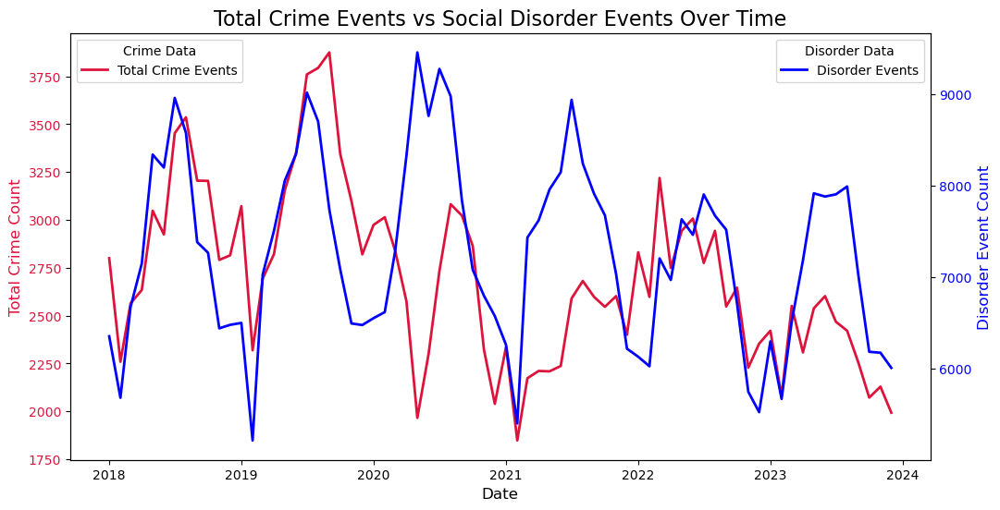

In [324]:
#Total Crime events vs Social Disorder Events
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting total crime events on the primary y-axis
#Crimes will use red, orange, pink palette and social disorder event will always be presented as blue
sns.lineplot(x='Date', y='Crime Count', data=crime_social_new, label='Total Crime Events', color='#DC143C', lw=2, ax=ax1) 

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Total Crime Count', fontsize=12, color='#DC143C')
ax1.tick_params(axis='y', labelcolor='#DC143C')

# Create secondary y-axis and plot on it
ax2 = ax1.twinx()
sns.lineplot(x='Date', y='Disorder Count', data=crime_social_new, label='Disorder Events', color='blue', lw=2, ax=ax2)

# Set labels for secondary y-axis
ax2.set_ylabel('Disorder Event Count', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Title of the graph
plt.title('Total Crime Events vs Social Disorder Events Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper left', title="Crime Data")
ax2.legend(loc='upper right', title="Disorder Data")
plt.show()

#### Is there any relation between the social disorders and total crimes in Calgary? (Guiding Quesiont 5)

<p style='text-align: justify;'>In the Total Crime Events vs. Social Disorder analysis, we can identify that before 2020, there was a strong correlation between these two main categories of criminal events. In 2020, as expected, this behavior changed: the total number of crimes tended to decrease, while social disorder events reached their highest levels during the analyzed period. This may be related to COVID-19 pandemic restrictions, where gatherings of multiple people were considered unsafe, potentially leading to an increase in reported incidents.</p>

<p style='text-align: justify;'>From 2022 onward, the correlation between total crimes and social disorder events strengthened again. </p>
    
#### Do crime categories follow consistent patterns year after year? (Guiding Question 4)
<p style='text-align: justify;'>In general, the recorded data shows cyclical patterns, with higher numbers of crimes and disorder events occurring around the middle of the year (summer). In the other way, towards the end of the year and the beginning of the next one (winter), crime and disorder event numbers tend to be lower.</p>

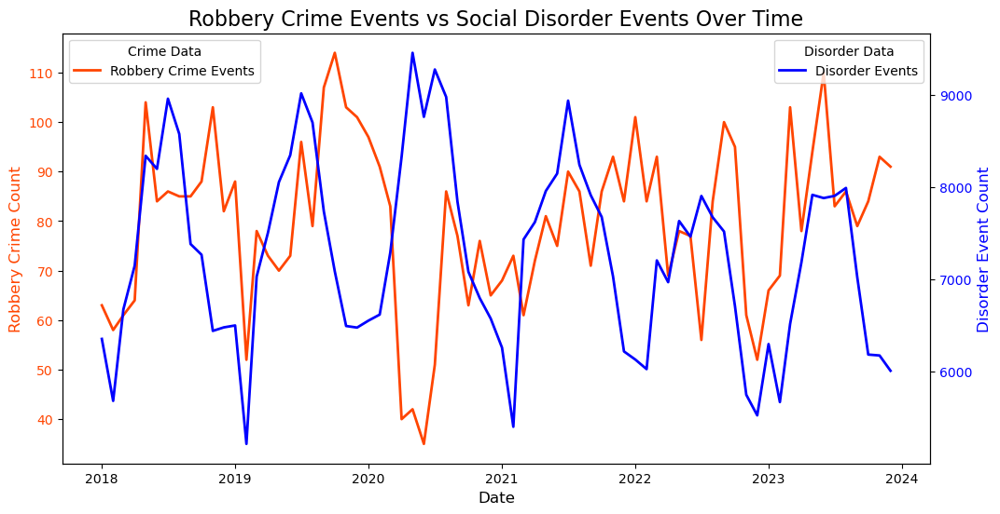

In [326]:
#Robbery Crime events vs Social Disorder Events
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting robbery crime events on the primary y-axis
sns.lineplot(x='Date', y='Crime Count', data=robbery_social_new, label='Robbery Crime Events', color='#FF4500', lw=2, ax=ax1)

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Robbery Crime Count', fontsize=12, color='#FF4500')
ax1.tick_params(axis='y', labelcolor='#FF4500')

# Secondary y-axis and plot on it
ax2 = ax1.twinx()
sns.lineplot(x='Date', y='Disorder Count', data=robbery_social_new, label='Disorder Events', color='blue', lw=2, ax=ax2)

# Set labels for secondary y-axis
ax2.set_ylabel('Disorder Event Count', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Title of the graph
plt.title('Robbery Crime Events vs Social Disorder Events Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper left', title="Crime Data")
ax2.legend(loc='upper right', title="Disorder Data")
plt.show()


#### What is the least common crime in Calgary? (Guiding Question 2)
<p style='text-align: justify;'>Robbery crime events do not show a strong correlation with social disorder events, and unlike the previous graph, there is no clear seasonal pattern in this crime category. It is important to note that this group includes records of both commercial robbery and street robbery.</p>

<p style='text-align: justify;'>Additionally, it is evident that this crime category does not represent the biggest safety concern in the city, as the numbers remain relatively low. The maximum recorded value is around 120 incidents, whereas in the previously analyzed graph, one of the highest recorded values (including all crime categories) was approximately 3,750 incidents.</p>

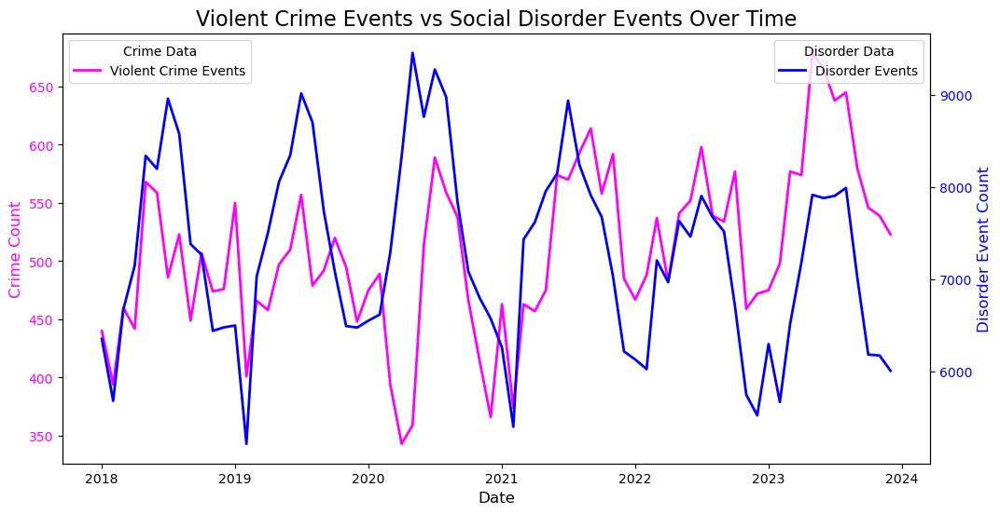

In [328]:
#Violent Crime events vs Social Disorder Events
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Crime events on primary y-axis
sns.lineplot(x='Date', y='Crime Count', data=violent_social_new, label='Violent Crime Events', color='magenta', lw=2,  ax=ax1)

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Crime Count', fontsize=12, color='magenta')
ax1.tick_params(axis='y', labelcolor='magenta')

# Create secondary y-axis and plot on it
ax2 = ax1.twinx()
sns.lineplot(x='Date', y='Disorder Count', data=violent_social_new, label='Disorder Events', color='blue', lw=2, ax=ax2)

# Set labels for secondary y-axis
ax2.set_ylabel('Disorder Event Count', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Title
plt.title('Violent Crime Events vs Social Disorder Events Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper left', title="Crime Data")
ax2.legend(loc='upper right', title="Disorder Data")
plt.show()


<p style='text-align: justify;'>Violent crime events do not show a strong correlation with social disorder events. However, they clearly tend to decrease in winter and remain stable during the other seasons. This crime category has historically had higher records than robbery crimes but is still not the most common crime in Calgary. A key observation is that this category has remained stable over time and showed an increase in 2023.</p>

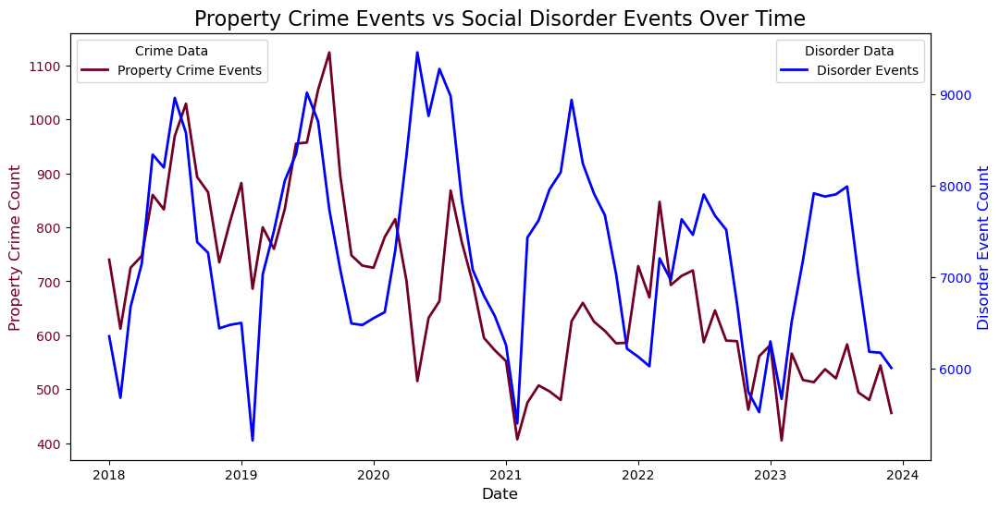

In [330]:
#Property Crime events vs Social Disorder Events
# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting property crime events on the primary y-axis
sns.lineplot(x='Date', y='Crime Count', data=property_social_new, label='Property Crime Events', color='#720026', lw=2, ax=ax1)

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Property Crime Count', fontsize=12, color='#720026')
ax1.tick_params(axis='y', labelcolor='#720026')

# Create secondary y-axis and plot on it
ax2 = ax1.twinx()
sns.lineplot(x='Date', y='Disorder Count', data=property_social_new, label='Disorder Events', color='blue', lw=2, ax=ax2)

# Set labels for secondary y-axis
ax2.set_ylabel('Disorder Event Count', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Title of the graph
plt.title('Property Crime Events vs Social Disorder Events Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper left', title="Crime Data")
ax2.legend(loc='upper right', title="Disorder Data")
plt.show()


<p style='text-align: justify;'>Property crime events also showed a strong correlation with disorder events before 2020. However, after the COVID-19 pandemic, it has not reached previous record levels, which is a positive trend. This crime category tends to be highly correlated with theft events. Over time, we can see that it is the second most prevalent crime category affecting people living in Calgary.</p>

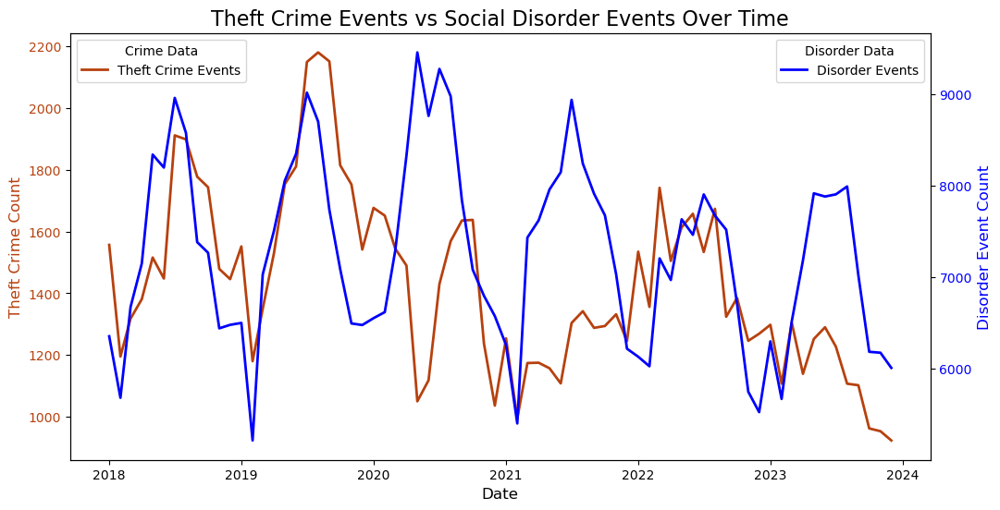

In [332]:
#Theft Crime events vs Social Disorder Events

# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting theft crime events on the primary y-axis
sns.lineplot(x='Date', y='Crime Count', data=theft_social_new, label='Theft Crime Events', color='#B7410E', lw=2, ax=ax1)

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Theft Crime Count', fontsize=12, color='#B7410E')
ax1.tick_params(axis='y', labelcolor='#B7410E')

# Create secondary y-axis and plot on it
ax2 = ax1.twinx()
sns.lineplot(x='Date', y='Disorder Count', data=theft_social_new, label='Disorder Events', color='blue', lw=2, ax=ax2)

# Set labels for secondary y-axis
ax2.set_ylabel('Disorder Event Count', fontsize=12, color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Title of the graph
plt.title('Theft Crime Events vs Social Disorder Events Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper left', title="Crime Data")
ax2.legend(loc='upper right', title="Disorder Data")
plt.show()


#### What is the most common crime in Calgary, and which community is the most affected? (Guiding Question 1)
<p style='text-align: justify;'>Theft crime events showed a strong correlation with social disorder events before 2020. However, after that, they have exhibited many fluctuations, mostly positive, as their trend from 2022 to end of 2023 shows a decrease.</p>

<p style='text-align: justify;'>This graph, along with the previous one that showed property crime events, highlights the importance of having comprehensive crime records that help the government and security entities identify the biggest safety issues in their cities and take action to reduce or mitigate them.</p>

<p style='text-align: justify;'>Although the recorded numbers are still high, exceeding a thousand incidents, this crime category has shown improvement over time. Nevertheless, it remains the most common crime event in Calgary.</p>

**Note: We will see in the map plots which is communities are the most affected by this crime category**

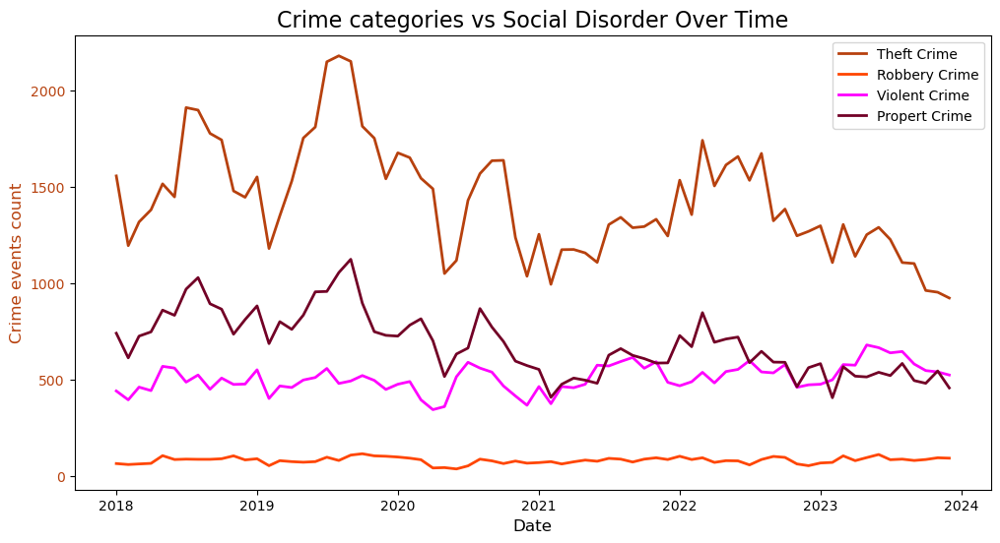

In [334]:
#All crime categories over time

fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting theft crime events on the primary y-axis
sns.lineplot(x='Date', y='Crime Count', data=theft_social_new, label='Theft Crime', color='#B7410E', lw=2, ax=ax1)
sns.lineplot(x='Date', y='Crime Count', data=robbery_social_new, label='Robbery Crime', color='#FF4500', lw=2, ax=ax1)
sns.lineplot(x='Date', y='Crime Count', data=violent_social_new, label='Violent Crime', color='Magenta', lw=2, ax=ax1)
sns.lineplot(x='Date', y='Crime Count', data=property_social_new, label='Propert Crime', color='#720026', lw=2, ax=ax1)

# Set labels for primary y-axis
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Crime events count', fontsize=12, color='#B7410E')
ax1.tick_params(axis='y', labelcolor='#B7410E')

# Title of the graph
plt.title('Crime categories vs Social Disorder Over Time', fontsize=16)

# Adding Legends
ax1.legend(loc='upper right', fontsize=10)
plt.show()


#### How has the crime evolved over the last five years? Are any crime categories increasing rapidly during this period?
<p style='text-align: justify;'>In general robbery crime category has remained stable from 2018 to 2023. Violent Crime has historically been the second least common category affecting Calgary. However, in 2023, it showed an increase, surpassing property crime category for the first time.</p>
    
<p style='text-align: justify;'>Property Crime category has been the second most prevalent crime type affecting Calagry during this period (2018-2023). As mentioned before, theft crime has always ranked as the most common crime. One important highligh is that the most frequent crime categories in Calgary city in the first years has shown a decrease. This decrease may be related to 2 main factors:</p>

* The covid-19 pandemic, as after 2020, neither of these two categories returned to their previous records levels.
*  Goverment strategies to face this problem.
  
<p style='text-align: justify;'>In conclusion, the overall trend has been positive, as crime records have remained stable, and the two historically most common crime categories are decreasing.To answer the second part of the question, no crime categories have increased dramatically during the analyzed period.</p>

In [336]:
import json
import pandas as pd
import plotly.express as px
import numpy as np

In [337]:
import plotly.io as pio
pio.renderers.default='jupyterlab'

In [338]:
import json

with open(r"C:\Users\andre\Documents\Msc of Data Science\Data 601\Project Gruop\calgary.geojson", 'r') as file:
    Calgary = json.load(file)


In [339]:
#Calgary['features'][0]

In [340]:
Calgary['features'][0].keys()

dict_keys(['type', 'properties', 'geometry'])

In [341]:
Calgary['features'][0]['properties']

{'name': 'Diamond Cove',
 'created_at': '2013-12-11T17:32:12+0100',
 'updated_at': '2013-12-13T18:51:54+0100',
 'cartodb_id': 277}

In [342]:
community_id_map={}
for feature in Calgary ['features']:
    feature['id'] = feature['properties']['cartodb_id']
    community_name = feature['properties']['name'].strip().upper()  # Normalize to lowercase
    community_id_map[community_name] = feature['id']

In [343]:
#community_id_map

In [344]:
#Mapping ids from geojson file and our dataframes to plot the maps

#Average monthly crimes - data preparation for plot (map)
df_crime_month_avg=pd.DataFrame(crime_dfc_total_community)
df_crime_month_avg['Community_upper'] = df_crime_month_avg['Community'].str.strip().str.upper()
df_crime_month_avg['id']=df_crime_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_crime_month_avg

#Average monthly disorder events - data preparation for plot (map)
df_disorder_month_avg=pd.DataFrame(disorder_dfc_total_community)
df_disorder_month_avg['Community_upper'] = df_disorder_month_avg['Community'].str.strip().str.upper()
df_disorder_month_avg['id']=df_disorder_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_disorder_month_avg

#Average monthly violent crime events - data preparation for plot (map)
df_violent_month_avg=pd.DataFrame(violent_dfc_total_community)
df_violent_month_avg['Community_upper'] = df_violent_month_avg['Community'].str.strip().str.upper()
df_violent_month_avg['id']=df_violent_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_violent_month_avg

#Average monthly property crime events - data preparation for plot (map)
df_property_month_avg=pd.DataFrame(property_dfc_total_community)
df_property_month_avg['Community_upper'] = df_property_month_avg['Community'].str.strip().str.upper()
df_property_month_avg['id']=df_property_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_property_month_avg

#Average monthly robbery events - data preparation for plot (map)
df_robbery_month_avg=pd.DataFrame(robbery_dfc_total_community)
df_robbery_month_avg['Community_upper'] = df_robbery_month_avg['Community'].str.strip().str.upper()
df_robbery_month_avg['id']=df_robbery_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_robbery_month_avg

#Average monthly thief events - data preparation for plot (map)
df_theft_month_avg=pd.DataFrame(theft_dfc_total_community)
df_theft_month_avg['Community_upper'] = df_theft_month_avg['Community'].str.strip().str.upper()
df_theft_month_avg['id']=df_theft_month_avg['Community_upper'].apply(lambda x:community_id_map.get(x,None))
#df_theft_month_avg



In [345]:
#Map to see crime distributions whitin in Calgary communities
#Disorder crime map (2018-2023)
# Define min and max values for color scale
min_val = df_disorder_month_avg['Event Count'].min()
max_val = df_disorder_month_avg['Event Count'].max()
disorder_map = px.choropleth_mapbox(df_disorder_month_avg, 
                   locations='id',
                   geojson=Calgary,
                   color='Event Count',
                   color_continuous_scale="Blues",  #Keeping same color palette as in line plots
                   range_color=[min_val,max_val],  # Set minimum and maximum color scale
                   hover_name='Community',
                   hover_data=['Event Count'],
                   mapbox_style="carto-positron",
                   center={'lat': 51.03, 'lon': -114},
                   zoom=8,
                   opacity=0.8,)
disorder_map.update_geos(fitbounds="locations", visible=False)
disorder_map.update_layout(title_text="Monthly avg of disorder events in Calgary", title_x=0.5)
disorder_map.show()

#Monthly crime map (2018-2023)
# Define min and max values for color scale
min_val = df_crime_month_avg['Crime Count'].min()
max_val = df_crime_month_avg['Crime Count'].max()
crime_map=px.choropleth_mapbox(df_crime_month_avg, 
                   locations='id',
                   geojson=Calgary,
                   color='Crime Count',
                   color_continuous_scale="Reds",
                   range_color=[2, 15],   
                  hover_name='Community',
                  hover_data=['Crime Count'],
                         mapbox_style="carto-positron",
                         center={'lat':51.03,'lon':-114},
                         zoom=8,opacity=0.7)
crime_map.update_geos(fitbounds="locations",visible=False)
crime_map.update_layout(title_text="Monthly avg of crime events in Calgary", title_x=0.5)
crime_map.show()

#### Do the social disorder events impact the records of crimes within the communities? (Guiding Question 6)

<p style='text-align: justify;'>The previous heatmaps represent the average crime and disorder events in Calgary, where more intense colors indicate higher average monthly events from 2018 to 2023.By analyzing the maps, we can see that both categories have a similar geographical distribution, with the Beltline and Downtown Commercial communities showing the highest monthly averages, followed by Forest Lawn Core in both maps.</p>

<p style='text-align: justify;'>In general, both categories show that from the middle to the north, crime and disorder events tend to have higher averages compared to the southern areas.</p>


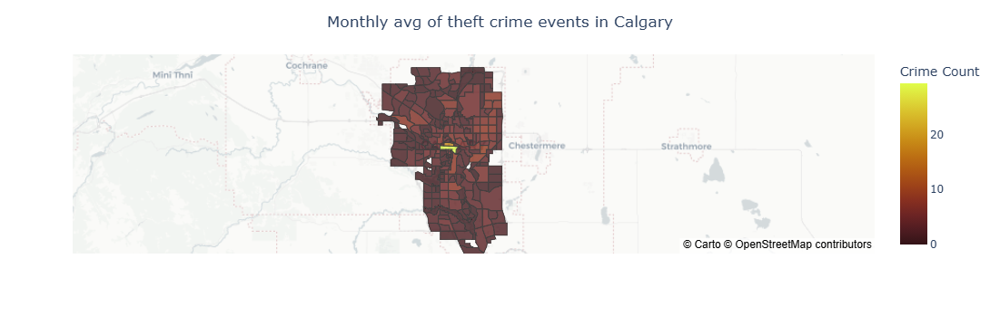

In [347]:

#Theft crime map (2018-2023)
# Define min and max values for color scale
min_val = df_theft_month_avg['Crime Count'].min()
max_val = df_theft_month_avg['Crime Count'].max()
theft_map=px.choropleth_mapbox(df_theft_month_avg, 
                   locations='id',
                   geojson=Calgary,
                   color='Crime Count',
                   color_continuous_scale="solar",  #Keeping same color palette as in line plots
                   range_color=[min_val,max_val],  # Set minimum and maximum color scale
                   hover_name='Community',
                   hover_data=['Crime Count'],
                         mapbox_style="carto-positron",
                         center={'lat':51.03,'lon':-114},
                         zoom=8.1,opacity=0.8)
theft_map.update_geos(fitbounds="locations",visible=False)
theft_map.update_layout(title_text="Monthly avg of theft crime events in Calgary", title_x=0.5)
theft_map.show()

#### What is the most common crime in Calgary, and which community is the most affected? (Guiding Question 1)
<p style='text-align: justify;'>As we already know, theft crime has historically been the most common crime in Calgary. Regarding specific communities, the map clearly shows that Beltline and Downtown Commercial Core are the most affected.</p>

<p style='text-align: justify;'>Additionally, the upper right side of the map, which corresponds to the northeast quadrant, is also among the most affected areas.</p>

# Conclusions

# References


* https://github.com/codeforgermany/click_that_hood/blob/main/public/data/calgary.geojson
* https://www.geeksforgeeks.org/get-unique-values-from-a-column-in-pandas-dataframe/
* https://www.scaler.com/topics/numpy-all/
* https://stackoverflow.com/questions/71842159/python-pandas-multiindex
* https://pandas.pydata.org/docs/reference/api/pandas.MultiIndex.from_product.html
* https://www.geeksforgeeks.org/change-data-type-for-one-or-more-columns-in-pandas-dataframe/
* https://stackoverflow.com/questions/11346283/renaming-column-names-in-pandas
* https://matplotlib.org/stable/gallery/subplots_axes_and_figures/two_scales.html
* https://likegeeks.com/seaborn-line-plot-secondary-y-axis/
* https://youtu.be/aJmaw3QKMvk?si=sbKQ3EkcyOQJEN-9    Note: We highly recommend watch this video
